<h1 style="color: white; background-color: black; font-weight: bold; text-align: center; border:3px solid black;">Dataset Preparation-DC GANs</h1>


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Loading sample Raw MRI Scans</h2>

In [2]:
import cv2
from matplotlib import pyplot as plt

image_paths_string = "/kaggle/input/oasis-actual/input/Mild Dementia/OAS1_0028_MR1_mpr-1_128.jpg,/kaggle/input/oasis-actual/input/Mild Dementia/OAS1_0028_MR1_mpr-4_136.jpg,/kaggle/input/oasis-actual/input/Mild Dementia/OAS1_0028_MR1_mpr-1_142.jpg,/kaggle/input/oasis-actual/input/Mild Dementia/OAS1_0028_MR1_mpr-2_139.jpg"
image_paths = image_paths_string.split(',')



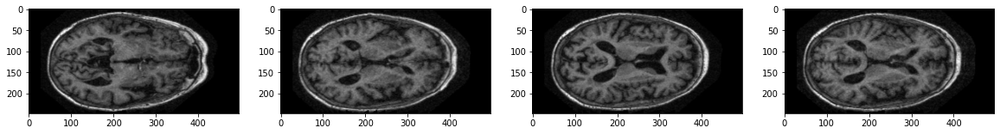

In [3]:
plt.figure(figsize=(20, 5))  
for i, path in enumerate(image_paths, start=1):
    image = cv2.imread(path)
    if image is not None:
        # Convert the image to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Add a subplot for each image
        plt.subplot(1, len(image_paths), i)
        plt.imshow(image_rgb)
        plt.axis('on')  
    else:
        print(f"Failed to load image: {path}")

plt.show()


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Rotating Images by 90 Degrees</h2>

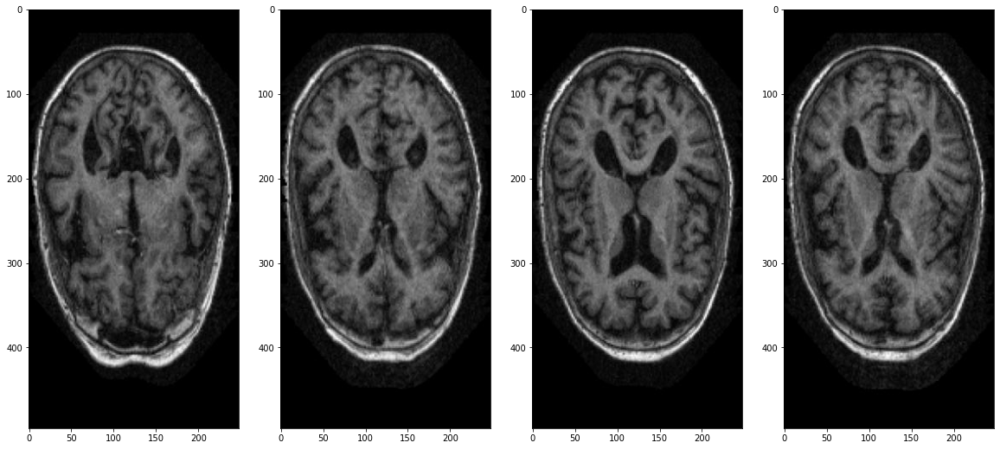

In [4]:
plt.figure(figsize=(20, 10))  
for i, path in enumerate(image_paths, start=1):
    # Read the image
    image = cv2.imread(path)
    if image is not None:
        # Rotate the image by 90 degrees clockwise
        rotated_image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
        # Convert the image from BGR to RGB
        rotated_image_rgb = cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB)
        
        # Add a subplot for each image
        plt.subplot(1, len(image_paths), i)
        plt.imshow(rotated_image_rgb)
        plt.axis('on')  
    else:
        print(f"Failed to load image: {path}")

plt.show()


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Importing Necessary Modules</h2>

In [5]:
import numpy as np 
import matplotlib.pyplot as plt 
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout, Resizing
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers import Adam
except:
    from keras.optimizers import Adam

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Hyper Parameters for DC-GANs</h2>

In [9]:
NOISE_DIM = 100  
BATCH_SIZE = 4 
STEPS_PER_EPOCH = 3750
EPOCHS = 10
SEED = 40
WIDTH, HEIGHT, CHANNELS = 128, 128, 1

OPTIMIZER = Adam(0.0002, 0.5)

In [10]:
MAIN_DIR = "/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/ModerateDemented"

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Load_Images() Definition</h2>

In [11]:
def load_images(folder):
    
    imgs = []
    target = 1
    labels = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder,i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (128,128))
            imgs.append(img)
            labels.append(target)
        except:
            continue
        
    imgs = np.array(imgs)
    labels = np.array(labels)
    
    return imgs, labels

In [12]:
data, labels = load_images(MAIN_DIR)
data.shape, labels.shape

((52, 128, 128), (52,))

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Generate random numbers to index images from data to feed it into the DC-GAN for training</h2>

In [13]:
np.random.seed(SEED)
idxs = np.random.randint(0, 50, 20)

In [14]:
X_train = data[idxs]
X_train.shape

(20, 128, 128)

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Normalizing and Resizing Images</h2>

In [15]:
# Normalize the Images
X_train = (X_train.astype(np.float32) - 127.5) / 127.5
# Reshape images 
X_train = X_train.reshape(-1, WIDTH,HEIGHT,CHANNELS)
X_train.shape

(20, 128, 128, 1)

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Plotting the Real Images</h2>

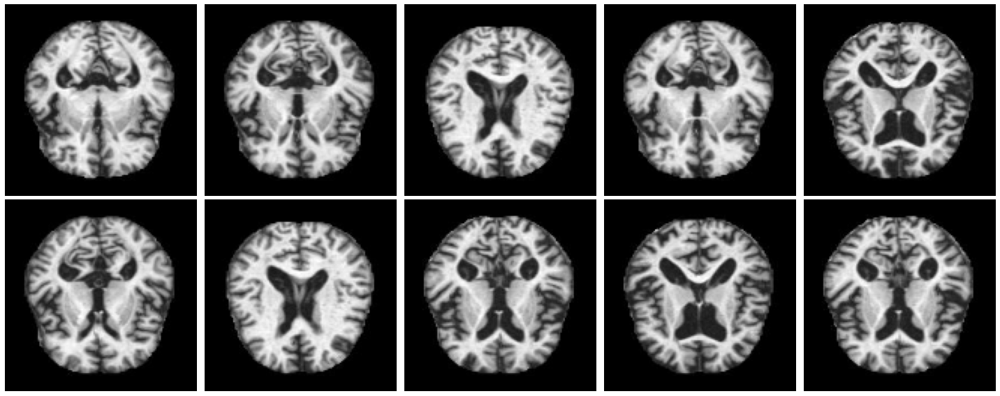

In [14]:
plt.figure(figsize=(20,8))
for i in range(10):
    axs = plt.subplot(2,5,i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
    axs.set_xticklabels([])
    axs.set_yticklabels([])
    plt.subplots_adjust(wspace=None, hspace=None)
plt.tight_layout()

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">The Architecture</h2>

In [16]:
def build_generator():

    

    model = Sequential([

        Dense(32*32*256, input_dim=NOISE_DIM),
        LeakyReLU(alpha=0.2),
        Reshape((32,32,256)),
        
        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')
    ], 
    name="generator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

    return model

In [17]:
def build_discriminator():
    

    model = Sequential([

        Conv2D(64, (3, 3), padding='same', input_shape=(WIDTH, HEIGHT, CHANNELS)),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Conv2D(256, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Flatten(),
        Dropout(0.4),
        Dense(1, activation="sigmoid", input_shape=(WIDTH, HEIGHT, CHANNELS))
    ], name="discriminator")
    model.summary()
    model.compile(loss="binary_crossentropy",
                        optimizer=OPTIMIZER)

    return model

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Merging Them Together</h2>

In [18]:
print('\n')
discriminator = build_discriminator()
print('\n')
generator = build_generator()

discriminator.trainable = False 

gan_input = Input(shape=(NOISE_DIM,))
fake_image = generator(gan_input)

gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output, name="gan_model")
gan.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

print("The Combined Network:\n")
gan.summary()



Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 64)      640       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 256)   

In [19]:
import os

def sample_images(noise, subplots, figsize=(22, 8), save=False, save_path="generated_images"):
    generated_images = generator.predict(noise)
    
    # Create the save directory if it doesn't exist
    if save and not os.path.exists(save_path):
        os.makedirs(save_path)

    plt.figure(figsize=figsize)
    
    for i, image in enumerate(generated_images):
        plt.subplot(subplots[0], subplots[1], i+1)
        if CHANNELS == 1:
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')    
        else:
            plt.imshow(image.reshape((WIDTH, HEIGHT, CHANNELS)))
        
        if save:
            img_name = os.path.join(save_path, f"gen_{i}.png")
            plt.savefig(img_name)
            print(f"Image saved at {img_name}")

        plt.subplots_adjust(wspace=None, hspace=None)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Training of DC-GAN</h2>

100%|██████████| 3750/3750 [05:18<00:00, 11.79it/s]


EPOCH: 1 Generator Loss: 6.0915 Discriminator Loss: 0.0045


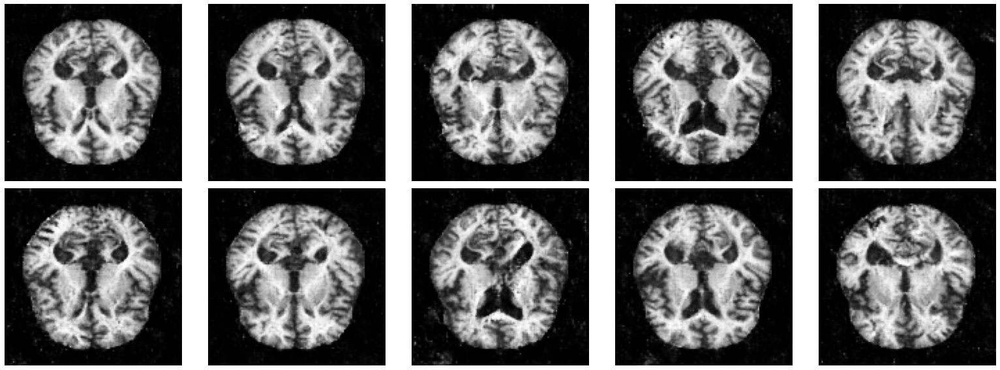

100%|██████████| 3750/3750 [05:04<00:00, 12.32it/s]


EPOCH: 2 Generator Loss: 5.7631 Discriminator Loss: 0.0428


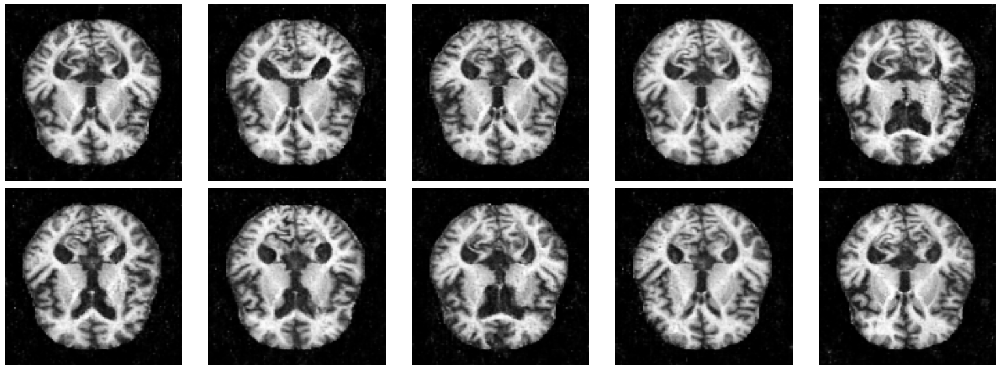

100%|██████████| 3750/3750 [05:05<00:00, 12.29it/s]


EPOCH: 3 Generator Loss: 9.2851 Discriminator Loss: 0.0028


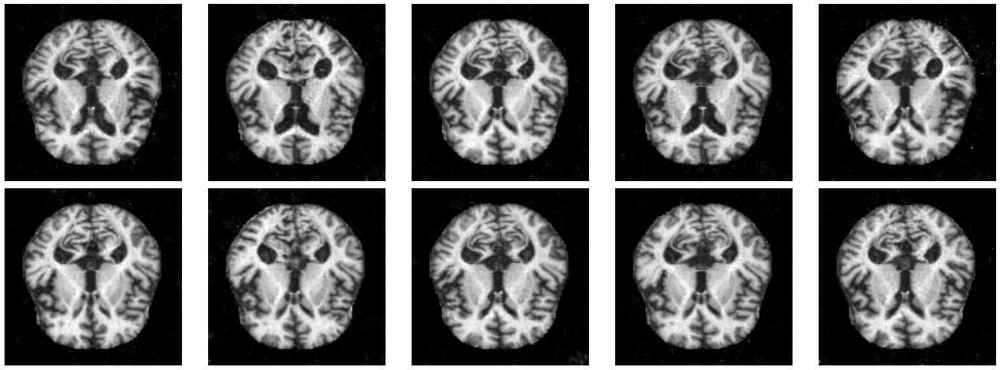

100%|██████████| 3750/3750 [05:06<00:00, 12.23it/s]


EPOCH: 4 Generator Loss: 8.8230 Discriminator Loss: 0.0357


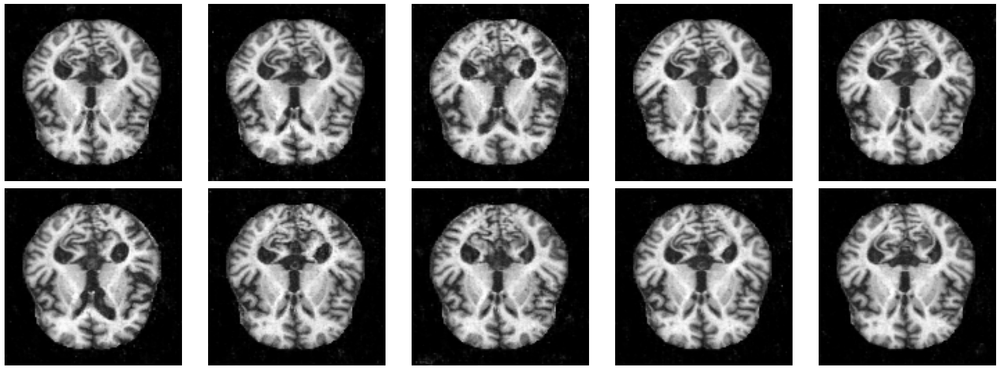

100%|██████████| 3750/3750 [05:05<00:00, 12.28it/s]


EPOCH: 5 Generator Loss: 6.2157 Discriminator Loss: 0.0042


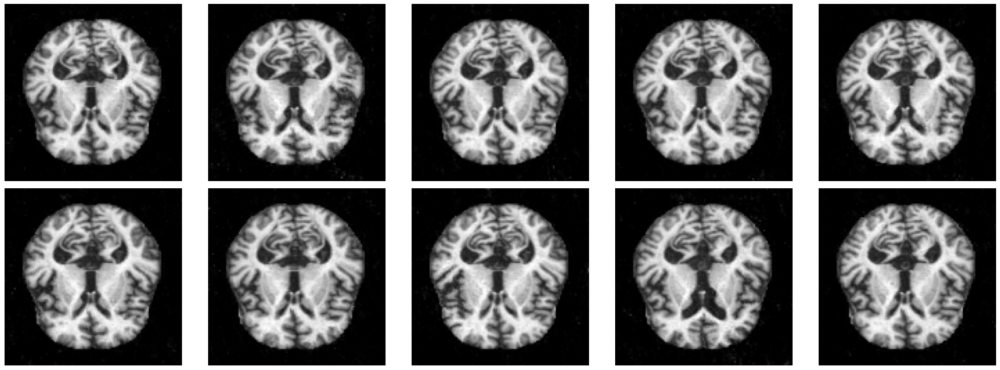

100%|██████████| 3750/3750 [05:05<00:00, 12.28it/s]


EPOCH: 6 Generator Loss: 5.7581 Discriminator Loss: 0.0043


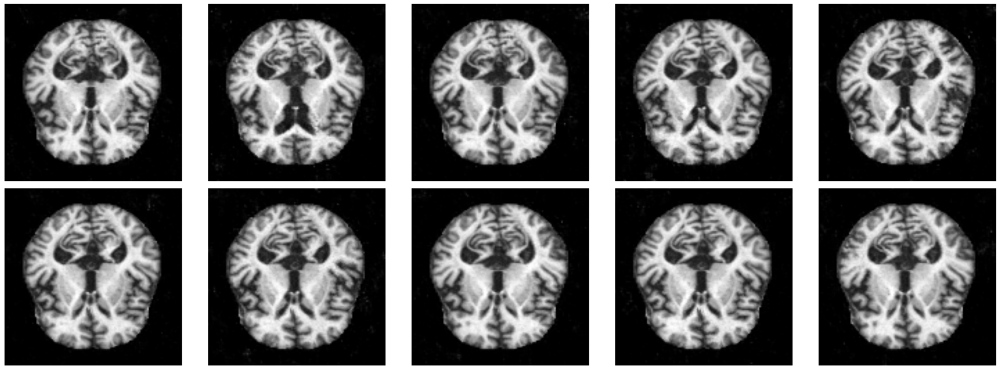

100%|██████████| 3750/3750 [05:06<00:00, 12.24it/s]


EPOCH: 7 Generator Loss: 6.6153 Discriminator Loss: 0.2348


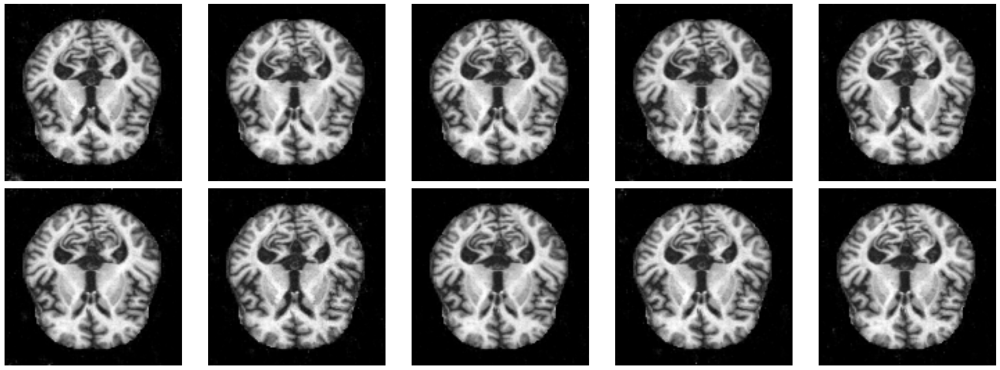

100%|██████████| 3750/3750 [05:06<00:00, 12.24it/s]


EPOCH: 8 Generator Loss: 3.9834 Discriminator Loss: 0.0935


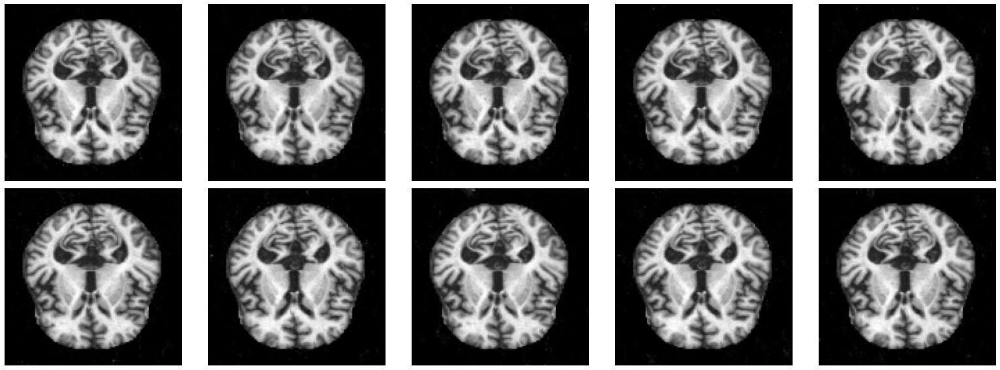

100%|██████████| 3750/3750 [05:05<00:00, 12.28it/s]


EPOCH: 9 Generator Loss: 3.3618 Discriminator Loss: 0.1299


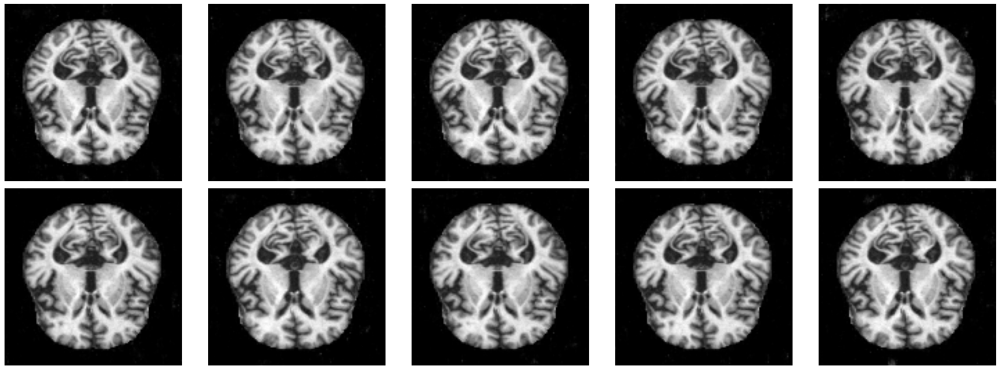

100%|██████████| 3750/3750 [05:07<00:00, 12.21it/s]


EPOCH: 10 Generator Loss: 7.1335 Discriminator Loss: 0.0150


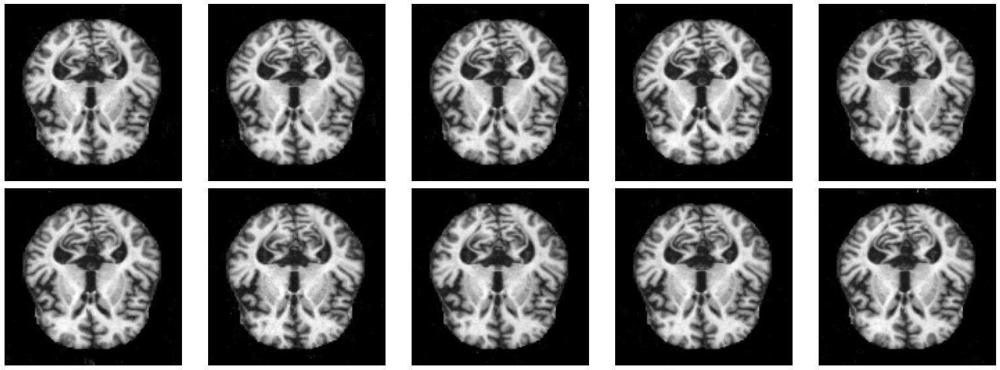

In [20]:
np.random.seed(SEED)
for epoch in range(10):
    for batch in tqdm(range(STEPS_PER_EPOCH)):

        noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
        fake_X = generator.predict(noise)
        
        idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
        real_X = X_train[idx]

        X = np.concatenate((real_X, fake_X))

        disc_y = np.zeros(2*BATCH_SIZE)
        disc_y[:BATCH_SIZE] = 1

        d_loss = discriminator.train_on_batch(X, disc_y)
        
        y_gen = np.ones(BATCH_SIZE)
        g_loss = gan.train_on_batch(noise, y_gen)

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss:.4f} Discriminator Loss: {d_loss:.4f}")
    noise = np.random.normal(0, 1, size=(10,NOISE_DIM))
    sample_images(noise, (2,5))

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Generate Images</h2>

In [ ]:
noise = np.random.normal(0, 1, size=(4, NOISE_DIM))
sample_images(noise, (2, 2),  (22, 8), save=True, save_path="/kaggle/working/ModerateDemented25")

Image saved at /kaggle/working/ModerateDemented25/gen_0.png
Image saved at /kaggle/working/ModerateDemented25/gen_1.png
Image saved at /kaggle/working/ModerateDemented25/gen_2.png
Image saved at /kaggle/working/ModerateDemented25/gen_3.png


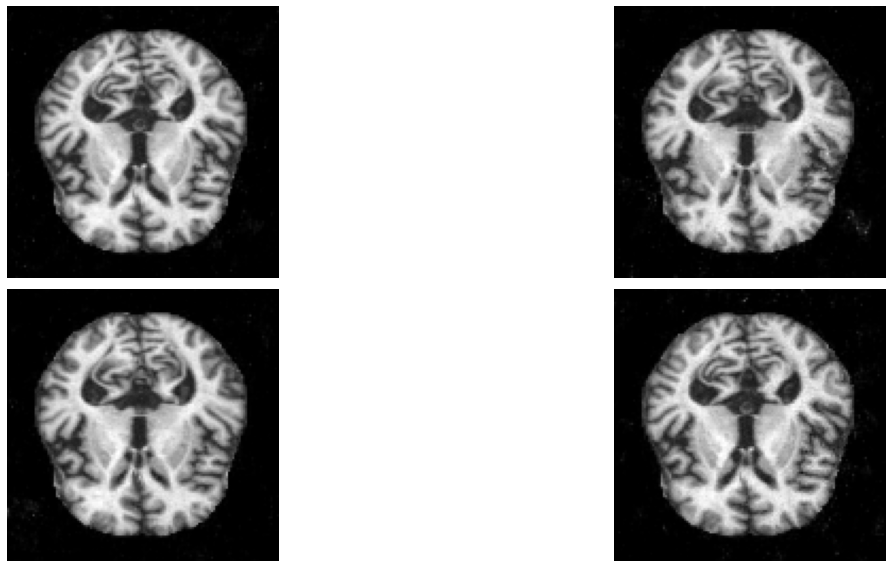

In [ ]:
noise = np.random.normal(0, 1, size=(4, NOISE_DIM))
sample_images(noise, (2, 2),  (22, 8), save=True, save_path="/kaggle/working/ModerateDemented25")


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Plotting the intensity distribution w.r.t pixels</h2>

In [21]:
generated_images = generator.predict(noise)
generated_images.shape

(4, 128, 128, 1)

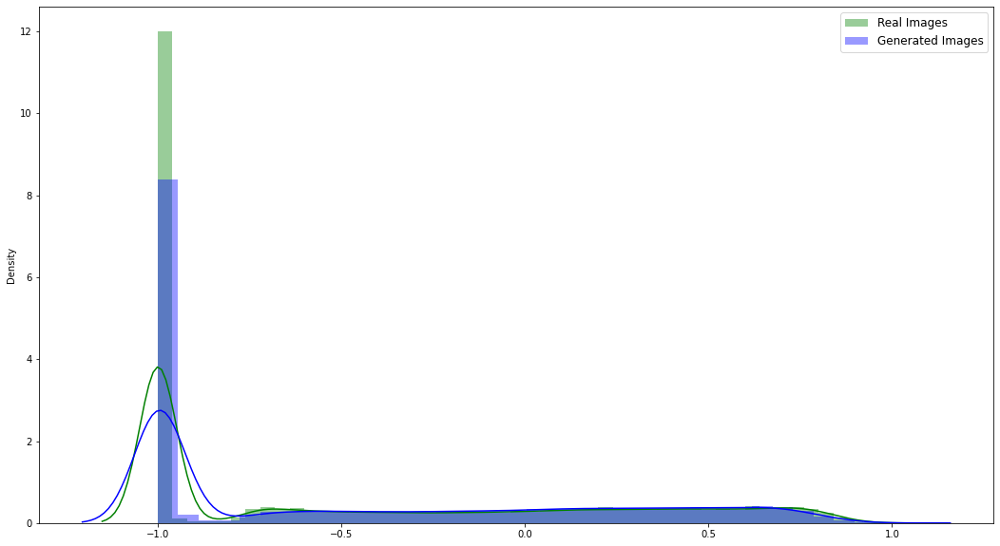

In [22]:
fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(18,10))

sns.distplot(X_train, label='Real Images', hist=True, color='green', ax=axs)
sns.distplot(generated_images, label='Generated Images', hist=True, color='blue', ax=axs)

axs.legend(loc='upper right', prop={'size': 12})

plt.show()

<h1 style="color: white; background-color: black; font-weight: bold; text-align: center; border:3px solid black;">Dataset Preparation-Histogram Matching</h1>


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Importing Modules</h2>

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Histogram Matching Function</h2>

In [25]:
def histogram_matching(source_img, reference_img):
    # Convert images to grayscale
    source_gray = cv2.cvtColor(source_img, cv2.COLOR_BGR2GRAY)
    reference_gray = cv2.cvtColor(reference_img, cv2.COLOR_BGR2GRAY)

    # Compute histograms
    source_hist, _ = np.histogram(source_gray.flatten(), bins=256, range=[0, 256])
    reference_hist, _ = np.histogram(reference_gray.flatten(), bins=256, range=[0, 256])

    # Compute cumulative distribution functions (CDFs)
    source_cdf = source_hist.cumsum()
    source_cdf_normalized = source_cdf / source_cdf[-1]

    reference_cdf = reference_hist.cumsum()
    reference_cdf_normalized = reference_cdf / reference_cdf[-1]

    # Create a mapping function
    mapping = np.interp(source_cdf_normalized, reference_cdf_normalized, range(256))

    # Apply the mapping to the source image
    matched_img = np.interp(source_gray.flatten(), range(256), mapping).reshape(source_gray.shape)

    # Convert back to 3-channel image if needed
    matched_img = cv2.cvtColor(matched_img.astype(np.uint8), cv2.COLOR_GRAY2BGR)

    return matched_img

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Histogram Matching for Mildly Demented MRI (MCIc)</h2>

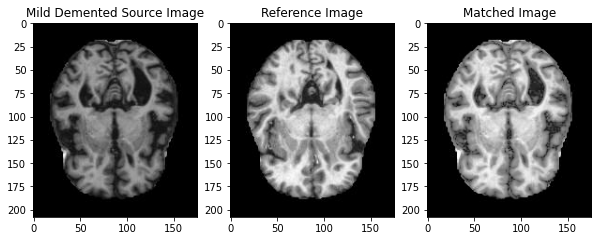

In [26]:
source_image = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/MildDemented/mildDem0.jpg')
reference_image = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/NonDemented/nonDem0.jpg')

# Perform histogram matching
matched_image = histogram_matching(source_image, reference_image)

# Display the results in the notebook
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(source_image, cv2.COLOR_BGR2RGB))
plt.title('Mild Demented Source Image')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB))
plt.title('Reference Image')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.title('Matched Image')

plt.show()

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Histogram Matching for Moderate Demented MRI (AD)</h2>

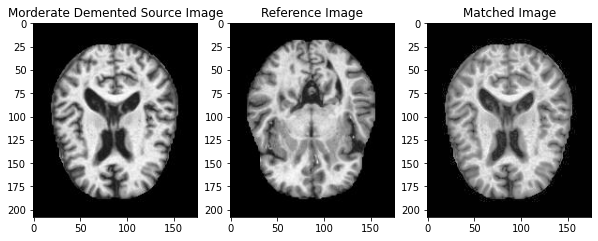

In [27]:
source_image = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/ModerateDemented/moderateDem39.jpg')
reference_image = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/NonDemented/nonDem0.jpg')

# Perform histogram matching
matched_image = histogram_matching(source_image, reference_image)

# Display the results in the notebook
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(source_image, cv2.COLOR_BGR2RGB))
plt.title('Morderate Demented Source Image')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB))
plt.title('Reference Image')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.title('Matched Image')

plt.show()

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Histogram Matching for Non Demented MRI (CN)</h2>

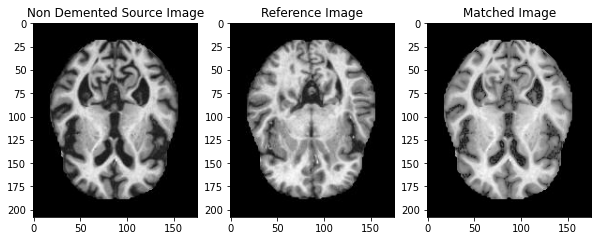

In [28]:
source_image = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/NonDemented/nonDem497.jpg')
reference_image = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/NonDemented/nonDem0.jpg')

# Perform histogram matching
matched_image = histogram_matching(source_image, reference_image)

# Display the results in the notebook
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(source_image, cv2.COLOR_BGR2RGB))
plt.title('Non Demented Source Image')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB))
plt.title('Reference Image')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.title('Matched Image')

plt.show()

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Histogram Matching for Very Mildly Demented MRI (MCInc)</h2>

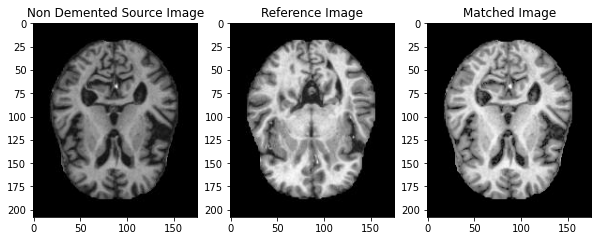

In [29]:
source_image = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/VeryMildDemented/verymildDem505.jpg')
reference_image = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/NonDemented/nonDem0.jpg')

# Perform histogram matching
matched_image = histogram_matching(source_image, reference_image)

# Display the results in the notebook
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(source_image, cv2.COLOR_BGR2RGB))
plt.title('Non Demented Source Image')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB))
plt.title('Reference Image')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.title('Matched Image')

plt.show()

<h1 style="color: white; background-color: black; font-weight: bold; text-align: center; border:3px solid black;">Alzh-Net Upper</h1>


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Importing Modules</h2>

In [1]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Importing Dataset</h2>

In [2]:
images = []
labels = []
for subfolder in tqdm(os.listdir('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset')):
    subfolder_path = os.path.join('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 2/2 [00:01<00:00,  1.03it/s]


,image,label
0,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
1,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
2,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
3,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
4,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
...,...,...
6395,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6396,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6397,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6398,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Visualising Dataset</h2>

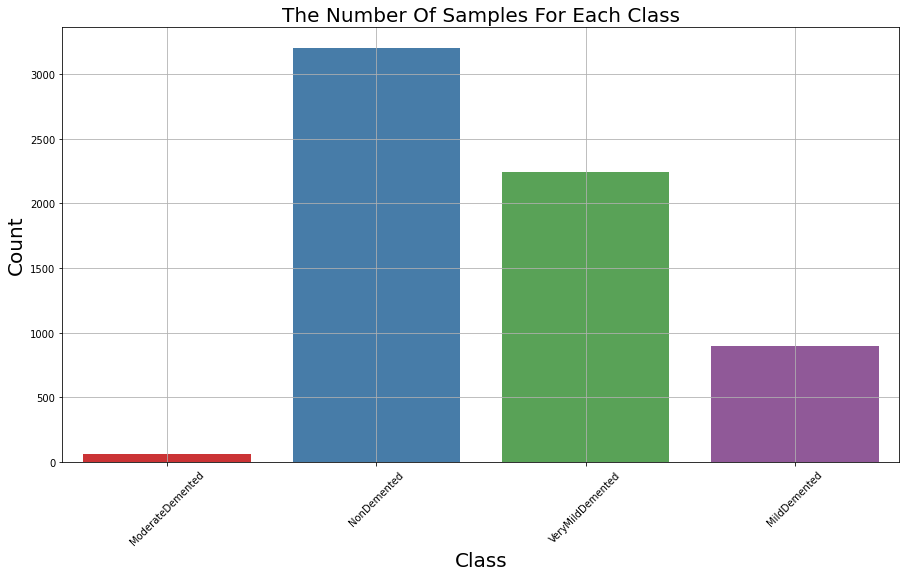

In [6]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

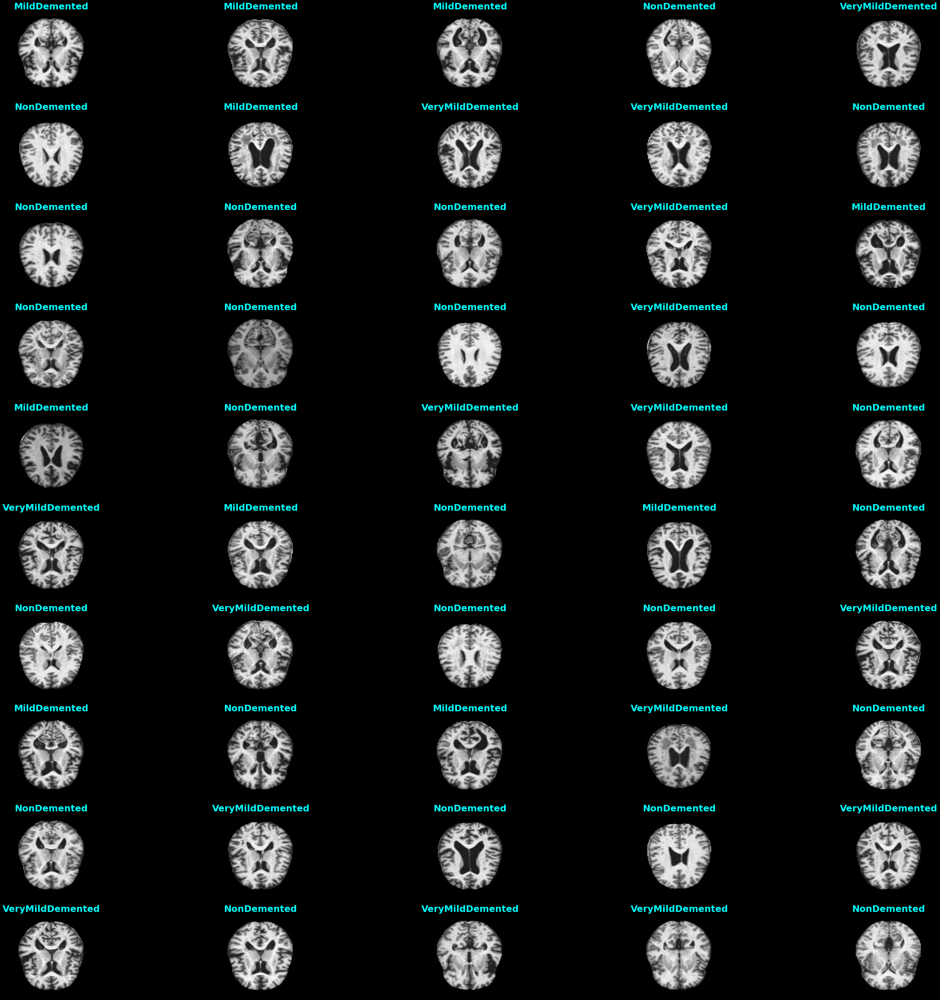

In [7]:
plt.figure(figsize=(50,50),facecolor='black')
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25,color='aqua',weight='bold')

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Oversampling Dataset</h2>

In [8]:
Size=(176,176)
work_dr = ImageDataGenerator(
    rescale = 1./255
)
train_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=6500, shuffle=False)

Found 6400 validated image filenames belonging to 4 classes.


In [9]:
train_data, train_labels = train_data_gen.next()

In [10]:
class_num=np.sort(['Alzheimer_s disease','Cognitively normal','Early mild cognitive impairment','Late mild cognitive impairment'])
class_num

array(['Alzheimer_s disease', 'Cognitively normal',
       'Early mild cognitive impairment',
       'Late mild cognitive impairment'], dtype='<U31')

In [11]:
sm = SMOTE(random_state=42)
train_data, train_labels = sm.fit_resample(train_data.reshape(-1, 176 * 176 * 3), train_labels)
train_data = train_data.reshape(-1, 176,176, 3)
print(train_data.shape, train_labels.shape)

(12800, 176, 176, 3) (12800, 4)


In [12]:
X_train, X_test1, y_train, y_test1 = train_test_split(train_data,train_labels, test_size=0.3, random_state=42,shuffle=True,stratify=train_labels)
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Alzh-Net UPPER</h2>

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input
import seaborn as sns
import cv2
import matplotlib.pyplot as plt

from PIL import Image

import tensorflow as tf
from tensorflow import keras

from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten

from keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import load_model
from sklearn.utils import shuffle

from tensorflow.keras.utils import to_categorical
import tensorflow_addons as tfa

from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split
from tensorflow.keras import Sequential, Input
from tensorflow.keras.layers import Dense, Dropout

from tensorflow.keras.utils import image_dataset_from_directory

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adamax

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from tensorflow.keras.layers import SeparableConv2D, BatchNormalization, MaxPool2D
IMG_SIZE = 176
IMAGE_SIZE = [176, 176]
DIM = (IMG_SIZE, IMG_SIZE)
ZOOM = [.99, 1.01]
BRIGHT_RANGE = [0.8, 1.2]
HORZ_FLIP = True
def conv_block(filters, act='relu'):
    
    block = Sequential()
    block.add(Conv2D(filters, 3, activation=act, padding='same'))
    block.add(Conv2D(filters, 3, activation=act, padding='same'))
    block.add(BatchNormalization())
    block.add(MaxPool2D())
    
    return block
def dense_block(units, dropout_rate, act='relu'):
    
    block = Sequential()
    block.add(Dense(units, activation=act))
    block.add(BatchNormalization())
    block.add(Dropout(dropout_rate))
    
    return block

class MyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('val_acc') > 0.99:
            print("\nReached accuracy threshold! Terminating training.")
            self.model.stop_training = True
            
my_callback = MyCallback()

early_stopping = EarlyStopping(monitor='val_loss', patience=2)
model = Sequential([
        Input(shape=(*IMAGE_SIZE, 3)),
        
        Conv2D(16, 3, activation='relu', padding='same'),
        Conv2D(16, 3, activation='relu', padding='same'),
        MaxPool2D(),
        
        conv_block(32),
        conv_block(64),
        conv_block(128),
        
        Dropout(0.2),
        conv_block(256),
        
        Dropout(0.2),
        Flatten(),
        dense_block(512, 0.7),
        dense_block(128, 0.5),
        dense_block(64, 0.3),
        Dense(4, activation='softmax')        
    ], 
    name = "cnn_model"
)

METRICS = [
    tf.keras.metrics.CategoricalAccuracy(name='acc'),
#     tf.keras.metrics.AUC(name='auc'), 
    tfa.metrics.F1Score(num_classes=4)
]

CALLBACKS = [my_callback]
    
model.compile(optimizer='adam',
              loss=tf.losses.CategoricalCrossentropy(),
              metrics=METRICS
)

model.summary()
#plot_model(model, show_shapes=True, show_layer_names=True, to_file='CNN_horizontal.png', rankdir='LR')
model_=keras.models.Sequential()
model_.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))
model_.add(keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model_.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model_.add(keras.layers.Conv2D(128,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model_.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model_.add(keras.layers.Flatten())
model_.add(keras.layers.Dense(1024,activation='relu'))
model_.add(keras.layers.Dropout(0.3))
model_.add(keras.layers.Dense(4,activation='softmax'))

Model: "cnn_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 176, 176, 16)      448       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 176, 176, 16)      2320      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 88, 88, 16)        0         
_________________________________________________________________
sequential (Sequential)      (None, 44, 44, 32)        14016     
_________________________________________________________________
sequential_1 (Sequential)    (None, 22, 22, 64)        55680     
_________________________________________________________________
sequential_2 (Sequential)    (None, 11, 11, 128)       221952    
_________________________________________________________________
dropout (Dropout)            (None, 11, 11, 128)       0 

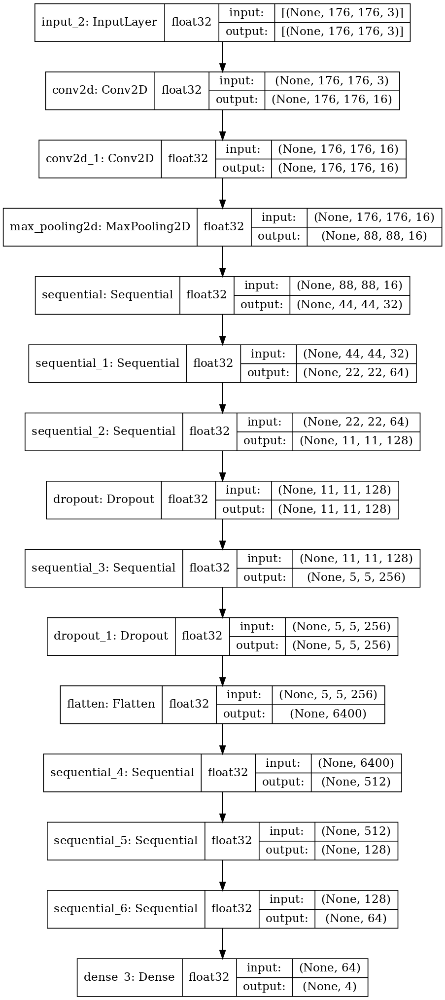

In [19]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Training Alzh-Net Upper</h2>

In [42]:
checkpoint_cb =ModelCheckpoint("CNN_model.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=100, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(X_train,y_train, epochs=40, validation_data=(X_val,y_val), callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/40
280/280 [==============================] - 5s 15ms/step - loss: 0.8782 - accuracy: 0.5751 - val_loss: 0.5211 - val_accuracy: 0.7677
Epoch 2/40
280/280 [==============================] - 3s 10ms/step - loss: 0.3953 - accuracy: 0.8307 - val_loss: 0.2927 - val_accuracy: 0.8714
Epoch 3/40
280/280 [==============================] - 3s 10ms/step - loss: 0.2191 - accuracy: 0.9079 - val_loss: 0.2498 - val_accuracy: 0.8995
Epoch 4/40
280/280 [==============================] - 3s 10ms/step - loss: 0.1227 - accuracy: 0.9513 - val_loss: 0.1207 - val_accuracy: 0.9594
Epoch 5/40
280/280 [==============================] - 3s 10ms/step - loss: 0.0901 - accuracy: 0.9650 - val_loss: 0.1092 - val_accuracy: 0.9651
Epoch 6/40
280/280 [==============================] - 3s 10ms/step - loss: 0.0455 - accuracy: 0.9842 - val_loss: 0.1224 - val_accuracy: 0.9547
Epoch 7/40
280/280 [==============================] - 3s 10ms/step - loss: 0.0424 - accuracy: 0.9860 - val_loss: 0.1235 - val_accuracy: 0.9630

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Evaluating Alzh-Net</h2>

In [43]:
hist_=pd.DataFrame(hist.history)

,loss,accuracy,val_loss,val_accuracy
0,0.878234,0.575112,0.521122,0.767708
1,0.395340,0.830692,0.292682,0.871354
2,0.219144,0.907924,0.249792,0.899479
3,0.122722,0.951339,0.120667,0.959375
4,0.090128,0.964955,0.109230,0.965104
5,0.045532,0.984152,0.122355,0.954687
6,0.042374,0.986049,0.123487,0.963021
7,0.049360,0.982701,0.198853,0.934375
8,0.030157,0.990067,0.102702,0.971354
9,0.019261,0.993973,0.096703,0.973958


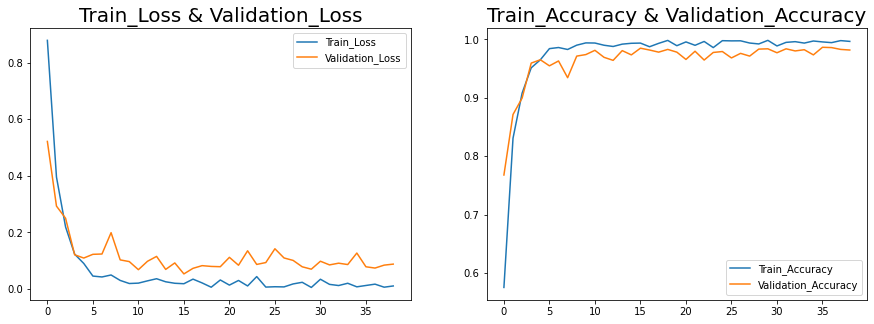

In [44]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'][:39],label='Train_Loss')
plt.plot(hist_['val_loss'][:39],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.xticks(range(0, 39, 5))
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'][:39],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'][:39],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.xticks(range(0, 39, 5))
plt.show()


In [45]:
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

60/60 [==============================] - 0s 6ms/step - loss: 0.0632 - accuracy: 0.9849
Test Loss = 0.06317868828773499
Test Accuracy = 0.9848958253860474


In [46]:
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

,Actual,Prediction
0,1,1
1,1,1
2,0,0
3,2,2
4,2,2
...,...,...
1915,2,2
1916,0,0
1917,2,2
1918,3,3


array([[478,   0,   1,   1],
       [  0, 480,   0,   0],
       [  4,   0, 473,   3],
       [ 10,   1,   9, 460]])

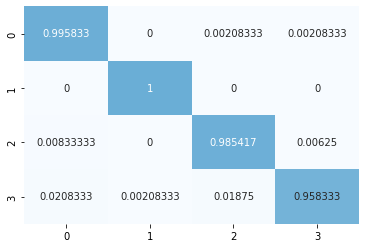

In [47]:
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [25]:
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.98      0.98      0.98       480
           1       1.00      1.00      1.00       480
           2       0.97      0.92      0.95       480
           3       0.93      0.97      0.95       480

    accuracy                           0.97      1920
   macro avg       0.97      0.97      0.97      1920
weighted avg       0.97      0.97      0.97      1920



array([[472,   0,   4,   4],
       [  0, 480,   0,   0],
       [  4,   0, 443,  33],
       [  5,   0,   9, 466]])

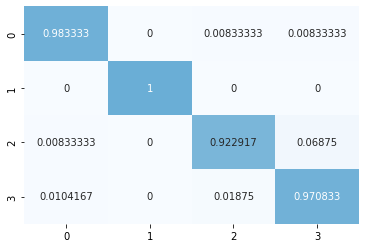

In [24]:
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

<h2 style="color: white; background-color: black; font-weight: bold; text-align: center; border:3px solid black;">Implementing Ensemble Methods</h2>

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Random Forest</h2>

In [17]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout
cnn_train_features = model.predict(X_train)
cnn_test_features = model.predict(X_test)

# Reshape CNN features to match RandomForest input
cnn_train_features = cnn_train_features.reshape(cnn_train_features.shape[0], -1)
cnn_test_features = cnn_test_features.reshape(cnn_test_features.shape[0], -1)

# Train a Random Forest classifier using CNN features
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(cnn_train_features, y_train)

# Predict using the Random Forest classifier
rf_predictions = rf_classifier.predict(cnn_test_features)

# Calculate accuracy
accuracy = accuracy_score(y_test, rf_predictions)


In [18]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Predict using the Random Forest classifier
rf_predictions = rf_classifier.predict(cnn_test_features)

# Calculate accuracy
accuracy = accuracy_score(y_test, rf_predictions)
print("Accuracy:", accuracy)

# Calculate precision, recall, and F1 score
precision = precision_score(y_test, rf_predictions, average='weighted')
recall = recall_score(y_test, rf_predictions, average='weighted')
f1 = f1_score(y_test, rf_predictions, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
y_test_labels = np.argmax(y_test, axis=1)
rf_predictions_labels = np.argmax(rf_predictions, axis=1)

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test_labels, rf_predictions_labels)
# Calculate sensitivity, specificity, and confusion matrix
#conf_matrix = confusion_matrix(y_test, rf_predictions)
true_negatives = conf_matrix[0][0]
false_positives = conf_matrix[0][1]
false_negatives = conf_matrix[1][0]
true_positives = conf_matrix[1][1]

Accuracy: 0.9692708333333333
Precision: 0.9703969391657047
Recall: 0.9692708333333333
F1 Score: 0.9697103559182544


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">XG Boost</h2>

In [19]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Convert one-hot encoded labels to class labels
y_train_labels = np.argmax(y_train, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Train an XGBoost classifier using CNN features
xgb_classifier = xgb.XGBClassifier(n_estimators=100, random_state=42)
xgb_classifier.fit(cnn_train_features, y_train_labels)

# Predict using the XGBoost classifier
xgb_predictions = xgb_classifier.predict(cnn_test_features)

# Calculate accuracy
accuracy = accuracy_score(y_test_labels, xgb_predictions)
print("Accuracy:", accuracy)

# Calculate precision, recall, and F1 score
precision = precision_score(y_test_labels, xgb_predictions, average='weighted')
recall = recall_score(y_test_labels, xgb_predictions, average='weighted')
f1 = f1_score(y_test_labels, xgb_predictions, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


Accuracy: 0.9703125
Precision: 0.9704199767140621
Recall: 0.9703125
F1 Score: 0.970271799505468


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">AdaBoost</h2>

In [21]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Convert one-hot encoded labels to class labels
y_train_labels = np.argmax(y_train, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Train an AdaBoost classifier using CNN features
adaboost_classifier = AdaBoostClassifier(n_estimators=100, random_state=42)
adaboost_classifier.fit(cnn_train_features, y_train_labels)

# Predict using the AdaBoost classifier
adaboost_predictions = adaboost_classifier.predict(cnn_test_features)

# Calculate accuracy
accuracy = accuracy_score(y_test_labels, adaboost_predictions)
print("Accuracy:", accuracy)

# Calculate precision, recall, and F1 score
precision = precision_score(y_test_labels, adaboost_predictions, average='weighted')
recall = recall_score(y_test_labels, adaboost_predictions, average='weighted')
f1 = f1_score(y_test_labels, adaboost_predictions, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


Accuracy: 0.9651041666666667
Precision: 0.9655437612842311
Recall: 0.9651041666666667
F1 Score: 0.965059577332363


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">GradientBoost</h2>

In [22]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Convert one-hot encoded labels to class labels
y_train_labels = np.argmax(y_train, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Train a Gradient Boosting classifier using CNN features
gradient_boosting_classifier = GradientBoostingClassifier(n_estimators=100, random_state=42)
gradient_boosting_classifier.fit(cnn_train_features, y_train_labels)

# Predict using the Gradient Boosting classifier
gradient_boosting_predictions = gradient_boosting_classifier.predict(cnn_test_features)

# Calculate accuracy
accuracy = accuracy_score(y_test_labels, gradient_boosting_predictions)
print("Accuracy:", accuracy)

# Calculate precision, recall, and F1 score
precision = precision_score(y_test_labels, gradient_boosting_predictions, average='weighted')
recall = recall_score(y_test_labels, gradient_boosting_predictions, average='weighted')
f1 = f1_score(y_test_labels, gradient_boosting_predictions, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


Accuracy: 0.9708333333333333
Precision: 0.9709414223688154
Recall: 0.9708333333333333
F1 Score: 0.9707719973228104


In [23]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Convert one-hot encoded labels to class labels
y_train_labels = np.argmax(y_train, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Train a CatBoost classifier using CNN features
catboost_classifier = CatBoostClassifier(iterations=100, random_seed=42)
catboost_classifier.fit(cnn_train_features, y_train_labels, verbose=False)

# Predict using the CatBoost classifier
catboost_predictions = catboost_classifier.predict(cnn_test_features)

# Calculate accuracy
accuracy = accuracy_score(y_test_labels, catboost_predictions)
print("Accuracy:", accuracy)

# Calculate precision, recall, and F1 score
precision = precision_score(y_test_labels, catboost_predictions, average='weighted')
recall = recall_score(y_test_labels, catboost_predictions, average='weighted')
f1 = f1_score(y_test_labels, catboost_predictions, average='weighted')
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


Accuracy: 0.9723958333333333
Precision: 0.9724710007515582
Recall: 0.9723958333333333
F1 Score: 0.9723637717608682
